# <center> Discover the City Owned Trees <center>
### <center> IS445 FINAL PROJECT <center>
### <center> By: Francis Feng <center>

## Data Introduction

City's website. It is important to select trees that are resistant to insect and disease damage, adaptable to local climates and soils, resistant to ice and wind damage, and of good structure and growth habits. Some trees are not allowed to be planted on City right-of-ways because of prolific fruit production that may litter streets or clog sewer lines, or because of their low visibility. As for evergreens, they are prohibited from planting on the City right-of-way because of the shade issue.

For this project, I plan to create a descriptive dashboard using data from Champaign GIS (geographic information system), which is an inventory of tree sites performed by Davey Tree Company in 2011. By collecting GPS data, maps, visiting sites, and analyzing the graphic and numeric data from the visualizations, we aim to create an interactive dashboard that provides several different visualizations.

In [2]:
%matplotlib inline
import IPython
import cartopy
import pandas as pd
import matplotlib.pyplot as plt
import geopandas 
import ipyleaflet
import numpy as np
import bqplot
import ipywidgets
import contextily as ctx
from ipywidgets import interact, interactive, fixed, interact_manual

## Data Exploratory 

- This dataset represents the data collection of trees in Champaign. 
This dataset contains the folloing fields of trees in champaign, such as Latitude,Longitude,Tree Unique ID
Address,Street, Condition, Tree Species Family, Diameter Measured at Breast Height, Species Plurali, etc. It includes the data types such as number, text and the date of time.
- The name of the dataset is "City_Owned_Trees"
- I obtained from the city of Champaign GIS, 
which is an inventory of tree sites originally performed by the Davey Tree Company in 2011

I input the dataset of the city owned trees and got a 29062 rows × 34 columns table of the dataset. 

In [10]:
gdf_trees = geopandas.read_file('https://opendata.arcgis.com/datasets/979bbeefffea408e8f1cb7a397196c64_22.geojson')
councils_data = geopandas.read_file('https://opendata.arcgis.com/datasets/1f75636917604299861fb408bbf79378_1.geojson')

In [60]:
City_Owned_Trees = pd.read_csv('City_Owned_Trees.csv',
                 names = ["UNIQUEID","INV_DATE","INSPECT_DT"],
                  parse_dates = ["INV_DATE", "INSPECT_DT"])

/Users/fengsfrancis/anaconda3/envs/DataViz/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (0,3,14,15,31) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [62]:
City_Owned_Trees = City_Owned_Trees.loc[:, City_Owned_Trees.notnull().any(axis = 0)]
City_Owned_Trees

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,UNIQUEID,INV_DATE,INSPECT_DT
X,Y,OBJECTID,ID,UNIQUEID,ADDRESS,STREET,ONSTR,FROMSTR,TOSTR,SIDE,SITE,SPP,COMMON,DBH,TRUNKS,COND,MT,GROW,OBSERVE,LOCTYPE,CULTIVAR,TREETYPE,INV_DATE,INSPECT_DT,NOTES,FACILITYID,SECTION,Special_Status,FAMILY,Staked_Status,Proprietary_ID,HydrationMat_Status,HydrationBag_Status
-88.2570930452148,40.1527234415946,1,1,RdG 20110912130753,3201,NOBEL DR,NEWTON DR,NOBEL DR,N PROSPECT AVE,Side Away,2,Quercus bicolor,"oak, swamp white",8,1,Fair,Young Tree Train,Tree Lawn or Parkway,None,Street,NaN,Tree,2011/09/12 00:00:00+00,2020/11/13 00:00:00+00,,1,36N,NaN,Fagaceae,NaN,1,NaN,NaN
-88.2575102414027,40.1527265425669,2,2,RdG 20110912131028,802,NEWTON DR,NEWTON DR,NOBEL DR,N PROSPECT AVE,Front,2,Quercus bicolor,"oak, swamp white",3,1,Good,Young Tree Train,Tree Lawn or Parkway,NaN,Street,NaN,Tree,2011/09/12 00:00:00+00,2020/11/13 00:00:00+00,,2,36N,Share the Cost,Fagaceae,NaN,2,NaN,NaN
-88.2573058179674,40.1526067226181,3,3,RdG 20110912131411,801,NEWTON DR,NEWTON DR,N PROSPECT AVE,NOBEL DR,Front,3,NaN,NaN,NaN,NaN,NaN,NaN,Tree Lawn or Parkway,NaN,Street,NaN,Vacant Site,2011/09/12 00:00:00+00,2016/10/13 00:00:00+00,,3,36N,NaN,NaN,NaN,3,NaN,NaN
-88.2568994980891,40.1527312196318,4,4,RdG 20110912130650,3201,NOBEL DR,NEWTON DR,NOBEL DR,N PROSPECT AVE,Side Away,1,Quercus bicolor,"oak, swamp white",6,1,Fair,Young Tree Train,Tree Lawn or Parkway,None,Street,NaN,Tree,2011/09/12 00:00:00+00,2020/11/13 00:00:00+00,,4,36N,NaN,Fagaceae,NaN,4,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
-88.2931054090449,40.0999924085989,136622,NaN,NaN,2808,LAWNDALE DR,LAWNDALE DR,CENTENNIAL DR,MAPLEPARK DR,Front,1,Acer saccharinum,"maple, silver",36.0,1.0,Fair,NaN,Open or Unrestricted,NaN,Street,NaN,Tree,2021/06/22 00:00:00+00,2021/06/22 00:00:00+00,Private tree that grew in to r.o.w.,29009,15,NaN,Aceraceae,NaN,NaN,NaN,NaN
-88.2532440414838,40.155078975004,137023,NaN,NaN,511,YALOW DR,YALOW DR,LEGGETT LN,SHARP DR,Front,NaN,NaN,NaN,6.0,3.0,NaN,NaN,Tree Lawn or Parkway,NaN,Street,NaN,Stump,2021/08/30 00:00:00+00,2021/08/30 00:00:00+00,Multi stem,29013,36N,NaN,NaN,NaN,NaN,NaN,NaN
-88.264432700877,40.1183730617085,137423,NaN,NaN,1116,W CHURCH ST,W CHURCH ST,DAVIDSON DR,N JAMES ST,Front,1,NaN,NaN,NaN,NaN,NaN,NaN,Tree Lawn or Parkway,NaN,Street,NaN,Vacant Site,2021/09/01 00:00:00+00,2021/09/01 00:00:00+00,NaN,29010,11,NaN,NaN,NaN,NaN,NaN,NaN
-88.2719850288127,40.087717598194,137823,21175.0,BB 20111116093105,2118,GEORGETOWN CIR,GEORGETOWN CIR,HARBOR POINT DR,CUL-DE-SAC,Front,1,NaN,NaN,NaN,NaN,NaN,NaN,Tree Lawn or Parkway,NaN,Street,NaN,Vacant Site,2021/09/21 00:00:00+00,2021/09/21 00:00:00+00,,29011,23,NaN,NaN,NaN,NaN,NaN,NaN


## Data Processing and Analysis 

- The following plot is the central interactive visualization featuring my primary dataset. The dataset used for the first layer of the interactivity depicts Champaign City districts approved in 2011 and based on 2010 Census data. For this one, I'm trying to show the Champaign City Council districts and the tree planting print. The projection I'm using is based on the Champaign City Council districts and trees in Champaign. The base map can help add a background base map to plots created with the geopandas .plot() method. One of the interesting aspects of this one is changing the background map for context. In this visualization, people who live in Champaign can see how their accommodation is surrounded by city-owned trees.

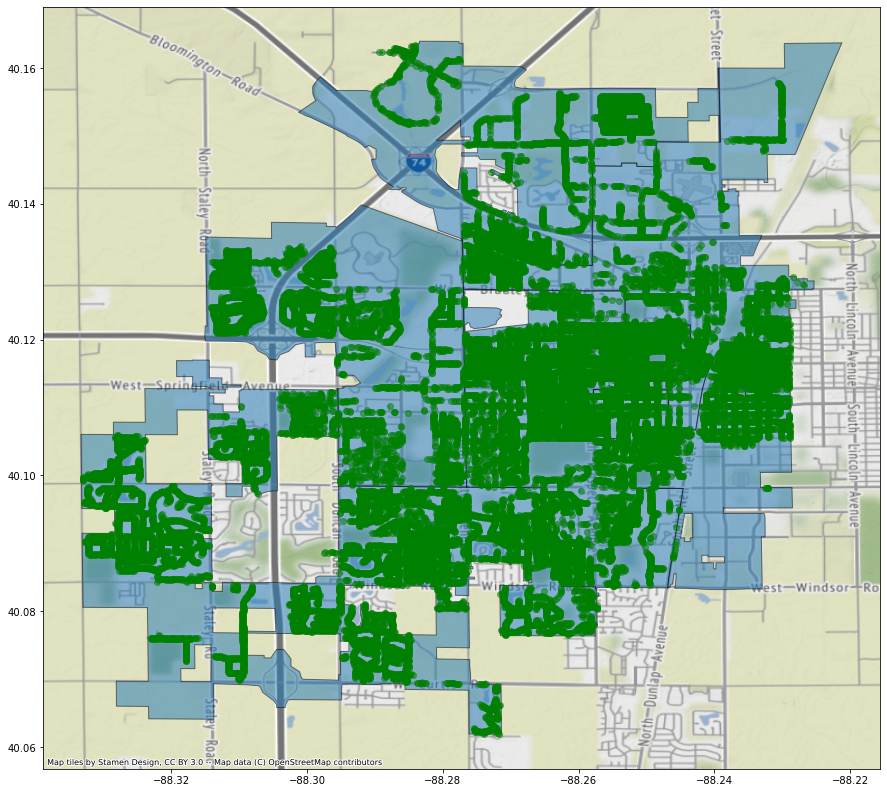

In [11]:
fig, ax = plt.subplots(figsize=(15,15))
councils_data.plot(ax = ax, alpha = 0.5, edgecolor = 'black')
gdf_trees.plot(ax=ax, alpha = 0.5, color='green')
ctx.add_basemap(ax = ax, crs = gdf_trees.crs)

plt.show()

For this projection, based on the last visualization, I accurated the coordinates to a specific location in Champaign that can let the readers have a better view.

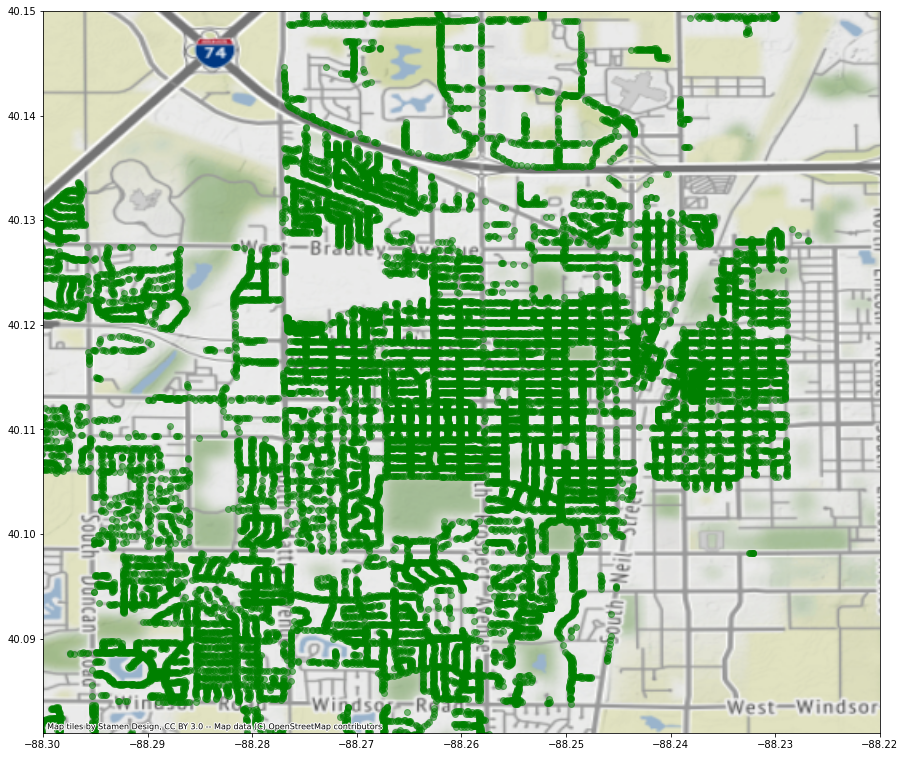

In [46]:
fig, ax = plt.subplots(figsize=(15,15))
gdf_trees.plot(ax=ax, alpha = 0.5, color='green')
ctx.add_basemap(ax = ax, crs = gdf_trees.crs)
ax.set_xlim(-88.30, -88.22)
ax.set_ylim(40.081, 40.15)
plt.show()

#### TASK 1: Assist the government in controlling the distribution of the trees, so it can prevent an imbalance of the distribution of the trees. 

In [69]:
df = pd.read_csv('/Users/fengsfrancis/Documents/UIUC/is445/final project/City_Owned_Trees.csv')
df

/Users/fengsfrancis/anaconda3/envs/DataViz/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3441: DtypeWarning: Columns (11,26) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,X,Y,OBJECTID,ID,UNIQUEID,ADDRESS,STREET,ONSTR,FROMSTR,TOSTR,...,INSPECT_DT,NOTES,FACILITYID,SECTION,Special_Status,FAMILY,Staked_Status,Proprietary_ID,HydrationMat_Status,HydrationBag_Status
0,-88.257093,40.152723,1,1.0,RdG 20110912130753,3201,NOBEL DR,NEWTON DR,NOBEL DR,N PROSPECT AVE,...,2020/11/13 00:00:00+00,,1,36N,NaN,Fagaceae,NaN,1.0,NaN,NaN
1,-88.257510,40.152727,2,2.0,RdG 20110912131028,802,NEWTON DR,NEWTON DR,NOBEL DR,N PROSPECT AVE,...,2020/11/13 00:00:00+00,,2,36N,Share the Cost,Fagaceae,NaN,2.0,NaN,NaN
2,-88.257306,40.152607,3,3.0,RdG 20110912131411,801,NEWTON DR,NEWTON DR,N PROSPECT AVE,NOBEL DR,...,2016/10/13 00:00:00+00,,3,36N,NaN,NaN,NaN,3.0,NaN,NaN
3,-88.256899,40.152731,4,4.0,RdG 20110912130650,3201,NOBEL DR,NEWTON DR,NOBEL DR,N PROSPECT AVE,...,2020/11/13 00:00:00+00,,4,36N,NaN,Fagaceae,NaN,4.0,NaN,NaN
4,-88.257312,40.152730,5,5.0,RdG 20110912130921,802,NEWTON DR,NEWTON DR,NOBEL DR,N PROSPECT AVE,...,2020/11/13 00:00:00+00,,5,36N,Share the Cost,Fagaceae,NaN,5.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29057,-88.293105,40.099992,136622,NaN,NaN,2808,LAWNDALE DR,LAWNDALE DR,CENTENNIAL DR,MAPLEPARK DR,...,2021/06/22 00:00:00+00,Private tree that grew in to r.o.w.,29009,15,NaN,Aceraceae,NaN,NaN,NaN,NaN
29058,-88.253244,40.155079,137023,NaN,NaN,511,YALOW DR,YALOW DR,LEGGETT LN,SHARP DR,...,2021/08/30 00:00:00+00,Multi stem,29013,36N,NaN,NaN,NaN,NaN,NaN,NaN
29059,-88.264433,40.118373,137423,NaN,NaN,1116,W CHURCH ST,W CHURCH ST,DAVIDSON DR,N JAMES ST,...,2021/09/01 00:00:00+00,NaN,29010,11,NaN,NaN,NaN,NaN,NaN,NaN
29060,-88.271985,40.087718,137823,21175.0,BB 20111116093105,2118,GEORGETOWN CIR,GEORGETOWN CIR,HARBOR POINT DR,CUL-DE-SAC,...,2021/09/21 00:00:00+00,,29011,23,NaN,NaN,NaN,NaN,NaN,NaN


In [103]:
df_family = df.groupby("FAMILY")["UNIQUEID"].count()
df_family

FAMILY
Aceraceae            6573
Adoxaceae               0
Altingiaceae          492
Anacardiaceae          21
Annonaceae              2
Aquifoliaceae           1
Betulaceae            451
Bignoniaceae           41
Cercidiphyllaceae      56
Cornaceae             128
Cupressaceae          452
Ebenaceae               4
Eucommiaceae           37
Fabaceae              723
Fagaceae             4436
Ginkgoaceae           322
Hamamelidaceae          3
Hippocastanaceae       85
Juglandaceae           69
Lauraceae               7
Magnoliaceae          528
Malvaceae             993
Moraceae               54
Musaceae                1
Nyssaceae             120
Oleaceae              452
Pinaceae              539
Platanaceae           449
Rosaceae             1288
Rutaceae               17
Salicaceae             13
Sapindaceae            28
Simaroubaceae           6
Styracaceae             2
Ulmaceae             1188
Unknown Tree           23
Name: UNIQUEID, dtype: int64

#### Task2: Analyze Champaign's tree species to determine whether we can have more diversity among them to prevent mass infections of specific viruses. Or determine the most prevalent tree species in Champaign.

Writeup: For this Dashboard that I created, first, viewers can get a table of the information of the city owned trees. I import the map to make viewers can get a clearly understanding of the Arrangement of the trees that the Champaign city owned. From the second map that I plot, I focus on a specific location that can see that the trees are not that evenly distributed in the city. Some place are obviously lacked of the green. I did the statistic of the family of the city owned trees, which we can see that the species of the trees in the city are also not evenly being planted.

In [ ]:
x_axis = widgets.RadioButtons(
    options=['','', '', '', '' ],
    description='Group by:',
    disabled=False
)

year_axis = widgets.IntSlider(
    value=2003,
    min=2003,
    max=2015,
    step=1,
    description='At year:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)

ui = widgets.HBox([x_axis, year_axis])

def bar(x, year):
    plt.figure(figsize=(15, 15))
    year_data = data[data['Year'] == year]
    plt_data = year_data[x].value_counts()
    plt.bar(plt_data.index, plt_data.values, color=['darkred', 'darkblue', 'purple', 'forestgreen', 'darkorange', 'chocolate'])
    plt.show

out = widgets.interactive_output(bar, {'x': x_axis, 'year': year_axis})

display(ui, out)

In [14]:
import PIL.Image as Image

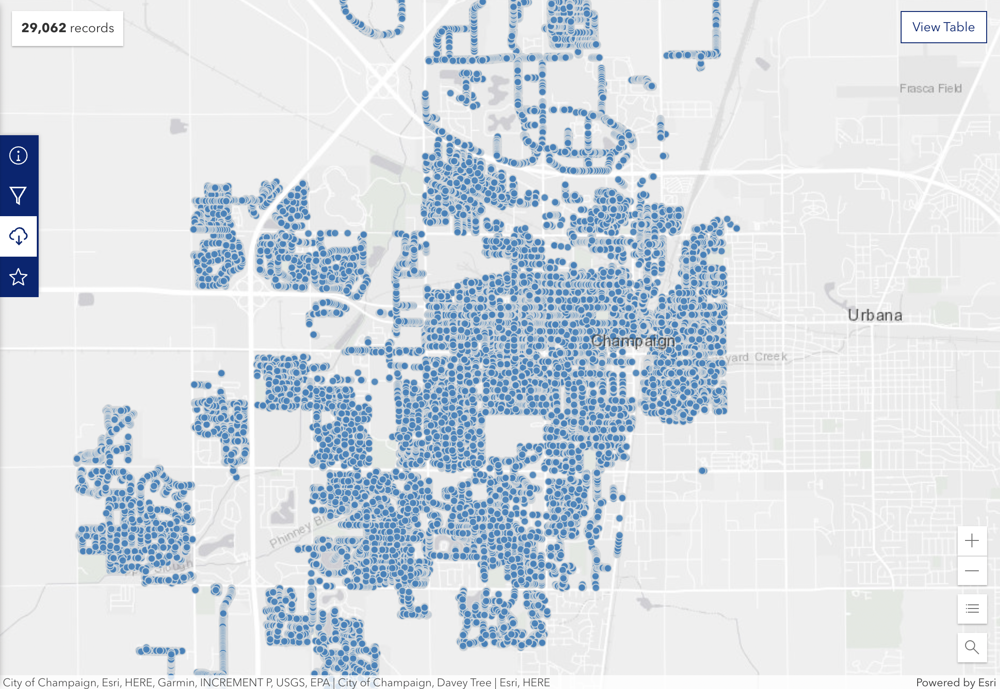

In [17]:
im1 = Image.open('1.JPG')
im1

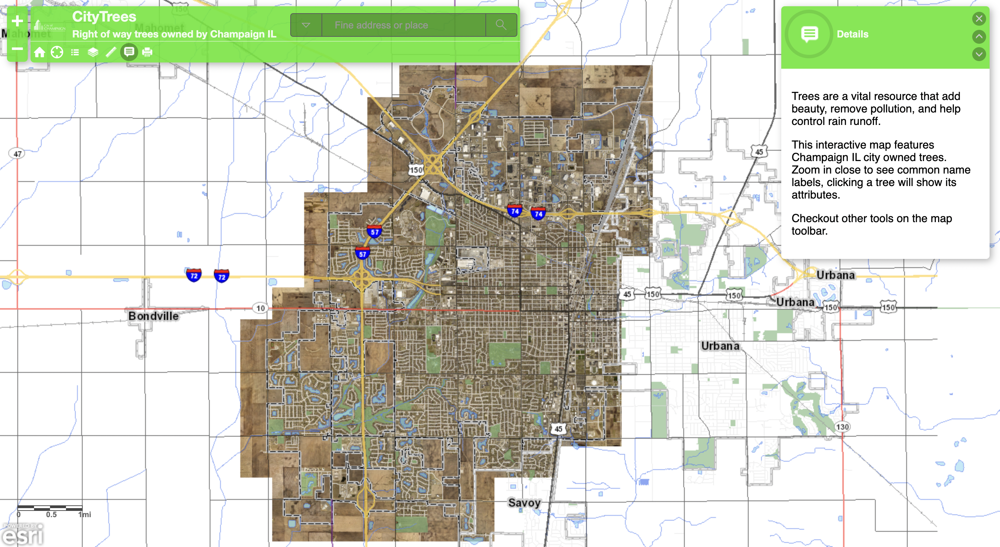

In [18]:
im2 = Image.open('2.JPG')
im2

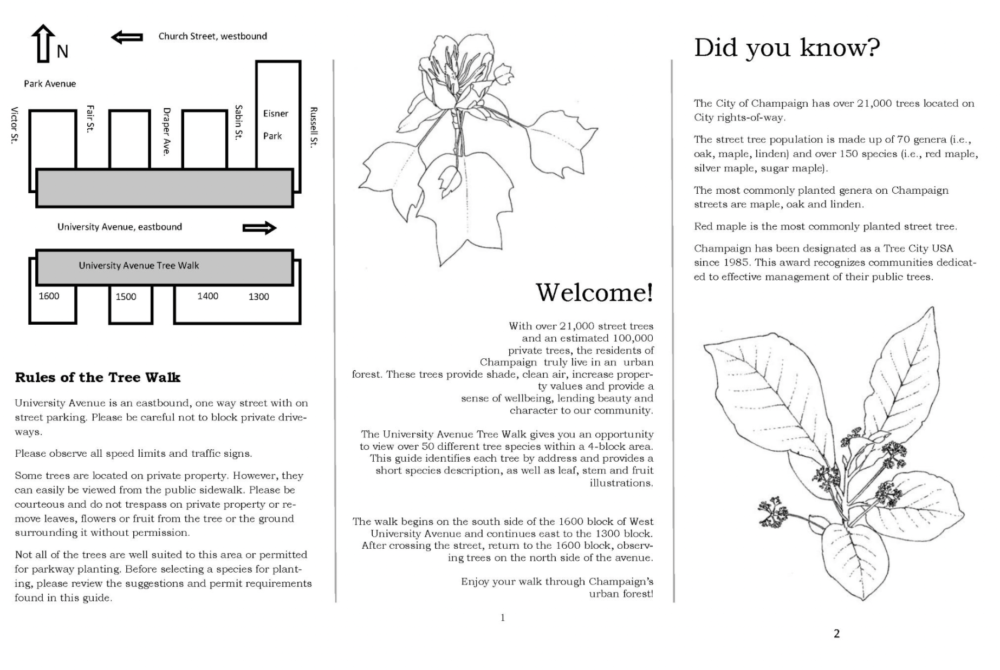

In [19]:
im1 = Image.open('3.JPG')
im1

Above are the three connective data visualization of this project. 

## Citations 

1. Champaign County Regional Data Portal https://data.ccrpc.org/no/dataset/city-owned-trees2
2. City of Champaign https://champaignil.gov/public-works/find-a-service/forestry-services/
3. Approved Tree Species List https://champaignil.gov/departments/approved-tree-species-list/ 